I have this grid (1/3 of RTS 96) and I'd like to intergrate wecs onto a few of the bus

- prep, I gather my .raw file and have a good idea of which buses I'd like to add my wecs

- I launch the WEC-GRID software to being the intergration process

- I import the software and initalize with the solver I have access too, in this case PSSe

- I use the viz feature to see my grid model and review the steady state data 

- next I then tell the software I was n amount of wecs a specified buses 


In [1]:


'''
here we import the Wec-Grid object
'''
import wec_grid as wg # import the software
import numpy as np



'''
Here we create a Wec-Grid Object, to create an object we need to pass Wec-Grid
a grid model file.

* actually lets update this to be either a selector or a function call


in the next line we select a PF solver, we can choose a couple if we want. 

* I think I need to update the viz function to work with either
* I think in the case we use a pyPSA the viz function does not work, will need to make that
clear some how 

we initalize the PSSe PF solver. lots of stuff just went down in the backgroud. 
PSSe took our case, solved it, and then the software pulled all the information and now is
store in a dataframe for us

* need to include time metrics
'''
WecObj = wg.Wec_grid("./grid_models/IEEE_24_bus.RAW") # initialize Object
WecObj.initalize_psse("fnsl")
#WecObj.initalize_pypsa()


'''
lets review our data, this is the dataframe I mentioned before, notice the structure,

'''
print(WecObj.psse_dataframe) # review my data


'''
we bulit this handy vizulize tool to help ourselves and the user understand and explore
the grid values, bare bones currently but will be scales up soon to look similar to matpower 
'''



''''
after 
'''
# create WEC objects
WecObj.create_wec(ID=1, model="LUPA", bus_location=21)
WecObj.create_wec(ID=2, model="LUPA", bus_location=22)
WecObj.create_wec(ID=3, model="LUPA", bus_location=23)
WecObj.create_cec(ID=4, model="CEC", bus_location=14)


WecObj.viz()  # review my data

# use case, find optimal locations 
     # smallest swings in swing bus ?

# how slow is to scale? 
# 1, 10, 100


# how to measure, benchmark

# machine config, time?
     # warm start? 

# Matlab profiler, maybe something similar for this? total time? 
     # bottle necks? for scalable
     # Wec-Sim, PF solver, 



## TO DO




    Sets PSSE environment to latest minor version among installed versions of PSSE 35.
    Use psse35.set_minor(n) to set PSSE35 minor version (n) to use.
        Example, for PSSE 35.0.x, use this as: psse35.set_minor(0)

 Input error detected at !
 -m ipykernel_launcher --ip=127.0.0.1 --stdin=9003 --control=9001 --hb=9000 "--Session.signature_scheme=\"hmac-sha256\"" "--Session.key=b\"e44719e5-3f5c-4fe4-9dd7-f326aca3e943\"" --shell=9002 "--transport=\"tcp\"" --iopu
                                                                                                          !

 PSS(R)E Xplore Version 35
 Copyright (c) 1976-2023
 Siemens Industry, Inc.,
 Power Technologies International                            (PTI)
 This program is a confidential  unpublished  work  created  and  first
 licensed in 1976.  It is a trade secret which is the property of  PTI.
 All use,  disclosure,  and/or reproduction not specifically authorized
 by  PTI  is prohibited.   This  program is protected  under

In [2]:

config = {
    'sim_length': 60*60,
    'Tsample': 300, # 5 mins 
    'waveHeight': 2.5,
    'wavePeriod': 8,
    'waveSeed': np.random.randint(999999999)
}

config['wec_id'] = 1
WecObj.run_WEC_Sim(wec_id=1, sim_config=config)

# update to pass id as arg


config['wec_id'] = 2
WecObj.run_WEC_Sim(wec_id=2, sim_config=config)


config['wec_id'] = 3
WecObj.run_WEC_Sim(wec_id=3, sim_config=config)


WecObj.run_CEC_Sim(4, sim_config={'sim_length': 3600})
# 

NameError: name 'wec_grid_class_path' is not defined

In [5]:
config = {
    'sim_length': 3600
}
WecObj.run_CEC_Sim(4, sim_config=config)

In [4]:
WecObj.cec_list[0].dataframe

,time,ibus,pg,vs,pt,pb,qt,qb
0,0.0,1.0,0.000000,1.0,0.000000,0.0,0.000000,0.000000
1,0.1,1.0,0.018375,1.1,0.018375,0.0,9.999983,-9.999983
2,0.2,1.0,0.065649,1.1,0.065649,0.0,9.999785,-9.999785
3,0.3,1.0,0.141807,1.1,0.141807,0.0,9.998994,-9.998994
4,0.4,1.0,0.246788,1.1,0.246788,0.0,9.996954,-9.996954
...,...,...,...,...,...,...,...,...
11996,1199.6,1.0,262751.046457,1.1,262751.046457,0.0,0.000000,0.000000
11997,1199.7,1.0,262776.260536,1.1,262776.260536,0.0,0.000000,0.000000
11998,1199.8,1.0,262801.475157,1.1,262801.475157,0.0,0.000000,0.000000
11999,1199.9,1.0,262826.690320,1.1,262826.690320,0.0,0.000000,0.000000


In [3]:
WecObj.psse_dataframe

,BUS_ID,Bus,BASE,PU,ANGLED,Type,P Gen,Q Gen,P Load,Q Load,P,Q
0,1,BUS 1,138.0,1.000000,0.000000,3,35.930069,180.488586,NaN,NaN,35.930069,180.488586
1,2,BUS 2,138.0,0.997822,0.010373,2,67.000000,0.000000,97.0,20.000000,-30.000000,-20.000000
2,3,BUS 3,138.0,0.863703,10.755864,1,NaN,NaN,90.0,19.000000,-90.000000,-19.000000
3,4,BUS 4,138.0,0.887014,-0.415208,1,NaN,NaN,74.0,15.000001,-74.000000,-15.000001
4,5,BUS 5,138.0,0.927217,-0.229420,1,NaN,NaN,71.0,14.000000,-71.000000,-14.000000
5,6,BUS 6,138.0,0.907952,0.391817,1,NaN,NaN,68.0,14.000000,-68.000000,-14.000000
6,7,BUS 7,138.0,0.796234,-0.580059,2,64.000000,0.000000,62.0,13.000000,2.000000,-13.000000
7,8,BUS 8,230.0,0.805368,-0.868408,1,NaN,NaN,85.0,18.000000,-85.000000,-18.000000
8,9,BUS 9,138.0,0.834940,4.989085,1,NaN,NaN,175.0,36.000000,-175.000000,-36.000000
9,10,BUS 10,138.0,0.881702,3.723669,1,NaN,NaN,100.0,23.000000,-100.000000,-23.000000


In [7]:
# run injections

WecObj._psse_ac_injection(start=0,end=(60*60*4))


KeyError: <wec_grid.wec_grid.WEC object at 0x0000023BD1124A48>

In [4]:
WecObj.wec_list[0].dataframe[WecObj.wec_list[0].dataframe["time"] == 0.0].pg

0     0.0
12    0.0
Name: pg, dtype: float64

In [21]:
WecObj.wec_list[0].dataframe.to_csv("temp.csv")

In [9]:
WecObj.wec_list[0].dataframe[wec_list[0].dataframe["time"] == '0.0'].pg

NameError: name 'wec_list' is not defined

In [ ]:
bus.dataframe[bus.dataframe["time"] == t].pg

In [5]:
self.wec_list[0].dataframe.time.to_list()

[0.0,
 450.0,
 750.0,
 1050.0,
 1350.0,
 1650.0,
 1950.0,
 2250.0,
 2550.0,
 2850.0,
 3150.0,
 3450.0,
 0.0,
 450.0,
 750.0,
 1050.0,
 1350.0,
 1650.0,
 1950.0,
 2250.0,
 2550.0,
 2850.0,
 3150.0,
 3450.0,
 3750.0,
 4050.0,
 4350.0,
 4650.0,
 4950.0,
 5250.0,
 5550.0,
 5850.0,
 6150.0,
 6450.0,
 6750.0,
 7050.0,
 7350.0,
 7650.0,
 7950.0,
 8250.0,
 8550.0,
 8850.0,
 9150.0,
 9450.0,
 9750.0,
 10050.0,
 10350.0,
 10650.0,
 10950.0,
 11250.0,
 11550.0,
 11850.0,
 12150.0,
 12450.0,
 12750.0,
 13050.0,
 13350.0,
 13650.0,
 13950.0,
 14250.0,
 14550.0,
 14850.0,
 15150.0,
 15450.0,
 15750.0,
 16050.0,
 16350.0,
 16650.0,
 16950.0,
 17250.0,
 17550.0,
 17850.0,
 18150.0,
 18450.0,
 18750.0,
 19050.0,
 19350.0,
 19650.0,
 19950.0,
 20250.0,
 20550.0,
 20850.0,
 21150.0,
 21450.0]

In [1]:
import wec_grid as wg
import numpy as np

    Sets PSSE environment to latest minor version among installed versions of PSSE 35.
    Use psse35.set_minor(n) to set PSSE35 minor version (n) to use.
        Example, for PSSE 35.0.x, use this as: psse35.set_minor(0)


# TODO 

- CEC model intergration
- Upsampling code 
- update WEC 

In [2]:
WecObj = wg.Wec_grid("./grid_models/IEEE_24_bus.RAW") # initialize Object.. reads file ... finds a steady state
WecObj.initalize_psse("fnsl")


 Input error detected at !
 -m ipykernel_launcher --ip=127.0.0.1 --stdin=9003 --control=9001 --hb=9000 "--Session.signature_scheme=\"hmac-sha256\"" "--Session.key=b\"e2d9366a-c576-4157-9ca4-2137baa4acbb\"" --shell=9002 "--transport=\"tcp\"" --iopu
                                                                                                          !

 PSS(R)E Xplore Version 35
 Copyright (c) 1976-2023
 Siemens Industry, Inc.,
 Power Technologies International                            (PTI)
 This program is a confidential  unpublished  work  created  and  first
 licensed in 1976.  It is a trade secret which is the property of  PTI.
 All use,  disclosure,  and/or reproduction not specifically authorized
 by  PTI  is prohibited.   This  program is protected  under  copyright
 laws  of  non-U.S.  countries  and  by  application  of  international
 treaties.  All  Rights  Reserved  Under  The  Copyright  Laws.

 Could not find entry point runpy_add_to_sys_path

           SIEMENS POW

In [6]:
WecObj.psse_dataframe.loc[WecObj.psse_dataframe['BUS_ID'] == 21, 'Type'] = 2

In [3]:
WecObj.wec_list = [21, 22, 23]
WecObj.pull_wec_data()

In [5]:
for id in [21, 22, 23]:
    WecObj.run_WEC_Sim(wec_id = id, 
                    sim_length = (60*60*6), 
                    Tsample = 300, # 5 mins 
                    waveHeight = 2.5, 
                    wavePeriod = 8, 
                    waveSeed = np.random.randint(999999999)
                    )

Matlab Engine estbalished
calling W2G
displaying simulation plots
calling PSSe formatting
sim complete
Matlab Engine estbalished
calling W2G
displaying simulation plots
calling PSSe formatting
sim complete
Matlab Engine estbalished
calling W2G
displaying simulation plots
calling PSSe formatting
sim complete


In [6]:
WecObj.run_WEC_Sim

In [16]:
import pandas as pd
import sqlite3
con = sqlite3.connect("./wec_grid/WEC-SIM.db")
cur = con.cursor()
wec = pd.read_sql_query("SELECT * from WEC_output_{}".format(23), con)

In [14]:
wec

,time,ibus,pg,vs,pt,pb,qt,qb
0,0.0,1.0,0.000000,1.0,0.000000,0.0,0.000000,0.000000
1,450.0,1.0,20.797071,1.1,20.797071,0.0,56.242584,-56.242584
2,750.0,1.0,16.287774,1.1,16.287774,0.0,57.625657,-57.625657
3,1050.0,1.0,15.663973,1.1,15.663973,0.0,57.761712,-57.761712
4,1350.0,1.0,18.156578,1.1,18.156578,0.0,57.149148,-57.149148
...,...,...,...,...,...,...,...,...
67,20250.0,1.0,17.788179,1.1,17.788179,0.0,57.289138,-57.289138
68,20550.0,1.0,14.066701,1.1,14.066701,0.0,58.308407,-58.308407
69,20850.0,1.0,16.889964,1.1,16.889964,0.0,57.548458,-57.548458
70,21150.0,1.0,14.968929,1.1,14.968929,0.0,58.061219,-58.061219


In [4]:
for i in range(len(WecObj.wec_data[21])):
    WecObj._psse_ac_injection(start=0,end=(60*60*4))
    print("========================")


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    294.000         0.00000      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.911253         1.00000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         4.6851(     21     )   11.5706(     21     )
                                                             0.35612(     13     )   0.77630(     21     )
   1         1.6998(     21     )    2.0024(     18     )
                                                             0.12671(     24     )   0.21414(     21     )
   2         0.2849(     16     )    0.2095(     15     )
                                                             0.05753(      7     )   0.06332(     21     )
   3         0.0440(     16     )    0.0150(     16     )
                                                     

In [5]:
time = [450, (60 * 60 * 4)] # 4 hours

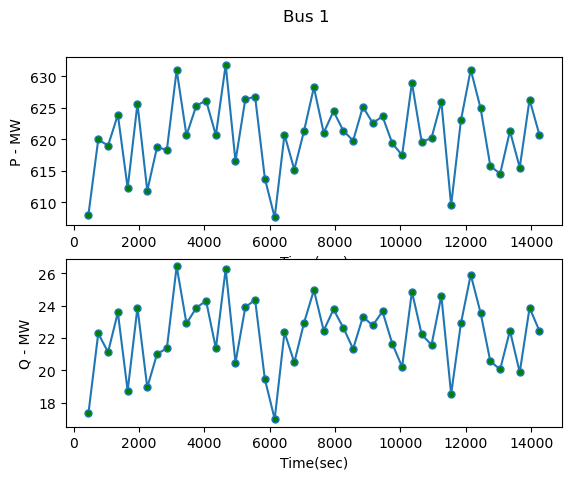

In [7]:
WecObj._psse_plot_bus(1, time)

In [1]:
import netCDF4 as nc
fn = "./wec_models/CEC/ds_streamwise_20ohms.nc"
ds = nc.Dataset(fn)

In [3]:
ds.variables

{'time': <class 'netCDF4._netCDF4.Variable'>
 int64 time(time)
     units: nanoseconds since 2021-09-15 22:30:00.980000019
     calendar: proleptic_gregorian
 unlimited dimensions: 
 current shape = (833,)
 filling on, default _FillValue of -9223372036854775806 used,
 'time_gps': <class 'netCDF4._netCDF4.Variable'>
 int64 time_gps(time_gps)
     units: seconds since 2021-09-15 00:00:01
     calendar: proleptic_gregorian
 unlimited dimensions: 
 current shape = (7789,)
 filling on, default _FillValue of -9223372036854775806 used,
 'dir': <class 'netCDF4._netCDF4.Variable'>
 vlen dir(dir)
     ref_frame: principal
 vlen data type: <class 'str'>
 unlimited dimensions: 
 current shape = (4,),
 'beam': <class 'netCDF4._netCDF4.Variable'>
 int32 beam(beam)
 unlimited dimensions: 
 current shape = (4,)
 filling on, default _FillValue of -2147483647 used,
 'range': <class 'netCDF4._netCDF4.Variable'>
 float64 range(range)
     _FillValue: nan
     units: m
 unlimited dimensions: 
 current shap